# Introduction to Computer Vision - Jacob Bigham
## 2. Intermediate Image Skills, Filters, Intro to Correlation Filtering
We've now seen some of the basic functionality of OpenCV. In particular, we know how to read and write images, view some of their basic underlying structure and channels, and we even used gradients to build a rudimentary edge detector. Now, let's build on that foundation and explore additional basic functions within OpenCV. Then, we'll discuss the basics of image filtering and introduce correlation filtering, which we'll expand in the next notebook.

This notebook explores the following:

1. Review
2. Additional basic OpenCV and NumPy features
3. Image Filters and Correlation Filters

We'll import the usual packages as well as a few of the functions we wrote in the previous notebook.

In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from cv_utils import show, show_sbs, image_as_function, better_edge_detector

I've slightly modified the `show` function so that we can occasionally change our figure size if need be, and I have added a `show_sbs` function to display images side-by-side if needed. I recommend looking at the code to make sure you understand what is going on beneath the hood:

    def show(image, x=5, y=5):
        """
        Displays a BGR or grayscale/single-channel image inline.
        """
        get_ipython().run_line_magic('matplotlib', 'inline')
        rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
        plt.figure(figsize=(x, y))
        plt.imshow(rgb)
        plt.axis('off')
        plt.show()
        
    def show_sbs(images, spacer_width = 15, show_width=10, show_height=10):
        """
        Displays the images in the 'images' iterable side-by-side, separated by a white spacer of spacer_width width.
        show_height and show_width optionally adjust the size of the displayed combined image.
        Images can be either BGR or grayscale.
        This is not useful for more than 2-5 images, depending on size.
        """
        num_images = len(images)
        height = max([image.shape[0] for image in images])
        width = sum([image.shape[1] for image in images]) + spacer_width * (num_images - 1)
        vertical_spacer = np.full((height, spacer_width, 3), 255, dtype=np.uint8)
        image_list = []
        for i, image in enumerate(images):
            if len(image.shape) == 2:
                image = cv.cvtColor(image, cv.COLOR_GRAY2BGR)
            if image.shape[0] != height:
                padding = np.full((height - image.shape[0], image.shape[1], 3), 255, dtype=np.uint8)
                padded = np.concatenate(image, padding, axis=0)
                image_list.append(padded)
            else:
                image_list.append(image)
            if i < (num_images - 1):
                image_list.append(vertical_spacer)
        sbs = np.concatenate(image_list, axis=1)
        show(sbs, show_width, show_height)

### 2.1 Review Exercises

Each notebook in this series will build on ideas, concepts, and skills developed in previous notebooks. Take a moment to make sure you are comfortable with these exercises before moving on to new material.

1. Write a function `create_color_image` that takes five arguments (height, width, red, green, and blue) and creates a solid color image with the given height, width, and levels (from 0-255) of R, G, and B color. For example, create_color_image(200, 400, 66, 245, 212) should create a 200 x 400 solid aqua image.
2. Save the image you created in exercise one as `img/aqua.jpg`.

***Exercise 1:*** Create each channel separately, then use the OpenCV function `merge` to merge the layers into one image. Make sure you don't get your RGB and BGR confused!

In [2]:
def create_color_image(height, width, red, green, blue):
    """
    Creates a solid BGR color image of dimension height x width with the given R, G, and B values.
    RGB values from 0-255.
    """
    if red < 0 or green < 0 or blue < 0:
        raise ValueError('Color values cannot be negative.')
    if red > 255 or green > 255 or blue > 255:
        raise ValueError('Color values must range from 0-255.')
    r = np.full((height, width), red, dtype=np.uint8)
    g = np.full((height, width), green, dtype=np.uint8)
    b = np.full((height, width), blue, dtype=np.uint8)
    image = cv.merge([b, g, r])
    return image

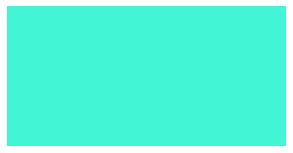

In [3]:
aqua = create_color_image(200, 400, 66, 245, 212)
show(aqua)

***Exercise 2:*** Use OpenCV's `imwrite` function to write the image to the specified path:

In [4]:
cv.imwrite('img/aqua.jpg', aqua)

True

### 2.2 More OpenCV and Numpy
In the previous notebook, we scratched the surface of basic image manipulation. Let's now explore some of the other basic image 
capabilities of OpenCV and NumPy.

>We can **access pixels directly** by indexing into the image.

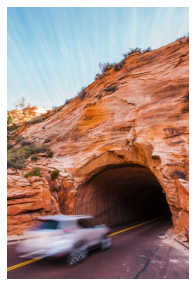

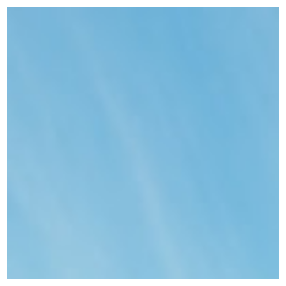

In [5]:
tunnel = cv.imread('img/tunnel.jpg')
show(tunnel)
top_left = tunnel[:100, :100, :]
show(top_left)

These accesses return *references* to the pixels, so we can edit them as well:

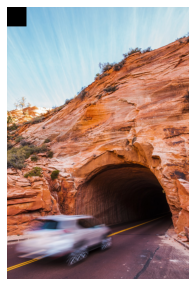

In [6]:
tunnel[:100, :100, :] = 0
show(tunnel)

Remember that when we index into an image, the first dimension is the y-coordinate, and the second dimension is the x-coordinate. ***You will forget this at some point. If you find that you have code that won't work, make sure you haven't swapped x and y!***
>We can shift pixels uniformly in a given direction (with wrap-around) using NumPy's `roll` function.

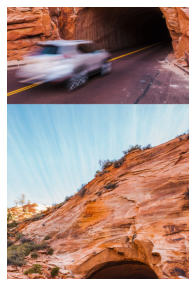

In [7]:
tunnel = cv.imread('img/tunnel.jpg')
tunnel = np.roll(tunnel, 500, axis=0)
show(tunnel)

>Because images are datasets, we can perform arithmetic operations on images.

In [8]:
tunnel = cv.imread('img/tunnel.jpg')
mean_pixel_intensity = np.mean(np.mean(tunnel, axis=2)) * 100 / 255
print('Average pixel brightness: {:.2f}%'.format(mean_pixel_intensity))

sd_pixel_intensity = np.std(np.mean(tunnel, axis=2))
print('Pixel value standard deviation: {:.2f}'.format(sd_pixel_intensity))

Average pixel brightness: 52.60%
Pixel value standard deviation: 64.59


Unweighted averaging is a way to quickly get a rudimentary grayscale version of an image:

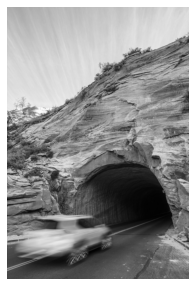

In [9]:
gray_tunnel = np.mean(tunnel, axis=2).astype(np.uint8)
show(gray_tunnel)

We could rudimentarily brighten an image by adding a constant value:

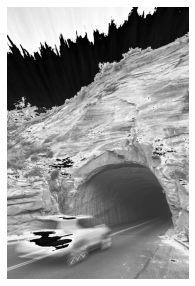

In [10]:
brighter_tunnel = gray_tunnel + 50
show(brighter_tunnel)

This doesn't look so good! What happened? Remember that uint8 values "wrap around" at 255. Let's try this instead:

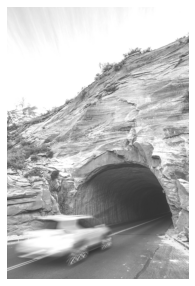

In [11]:
brighter_tunnel = np.minimum(gray_tunnel.astype(np.uint16) + 50, 255)
show(brighter_tunnel)

By first converting to uint16, we allow overflow. Any values that exceed 255 are cut down to 255 by the `minimum` function.

This is cumbersome. OpenCV has an `add` function that will take care of this for us:

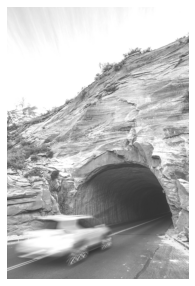

In [12]:
brighter_tunnel_2 = cv.add(gray_tunnel, 50)
show(brighter_tunnel_2)

In general, the `add` function can be used to combine images, though not always to nice effect:

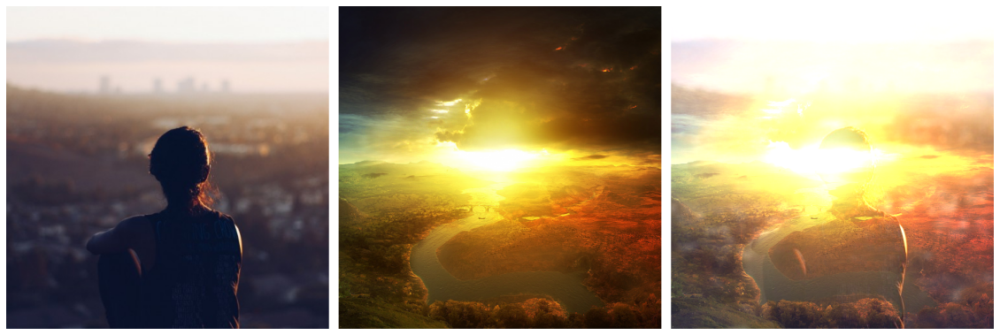

In [13]:
woman = cv.imread('img/woman.jpg')
scape = cv.imread('img/scape.png')
woman_scape = cv.add(woman, scape)
woman_scape.shape
show_sbs([woman, scape, woman_scape], show_width=20)

Some of the processing we will do in future notebooks will require us to deal with noise in images. Let's take compare two types of noise: **random noise** and **gaussian noise**:

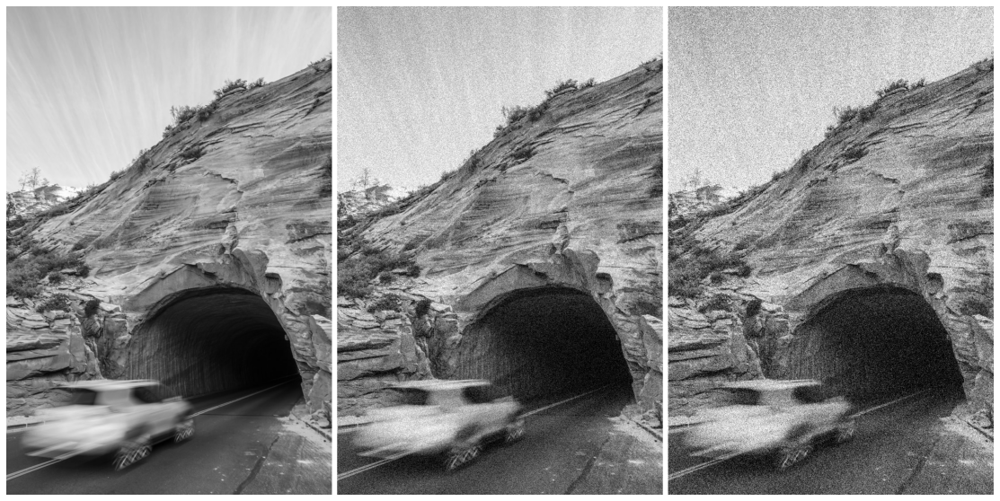

In [14]:
height, width = gray_tunnel.shape
random_noise = (np.random.rand(height, width) * 100 - 50).astype(int)
random_noise_tunnel = cv.add(gray_tunnel, random_noise, dtype=cv.CV_8UC1)
gaussian_noise = (np.random.randn(height, width) * 50).astype(int)
gaussian_noise_tunnel = cv.add(gray_tunnel, gaussian_noise, dtype=cv.CV_8UC1)
show_sbs((gray_tunnel, random_noise_tunnel, gaussian_noise_tunnel), show_width=20)

Notably, some of the mathematical operations can get ugly with respect to type conversion and sign preservation. It can sometimes be preferable to work with images in other formats, such a having pixel intensities range from 0 to 1 as floats. For now, because we are not focused on processing images in complicated formats, we'll stick to unsigned 8-bit representation.

Often, we will want or need to **pad** an image before or during processing. If you're familiar with convolutions or CNNs, you've no doubt seen this before:

In [15]:
ones = np.ones((3, 5), dtype=int)
print(ones, end='\n\n')
padded_ones = np.pad(ones, (1, 1), mode='constant', constant_values=(0))
print(padded_ones)

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]

[[0 0 0 0 0 0 0]
 [0 1 1 1 1 1 0]
 [0 1 1 1 1 1 0]
 [0 1 1 1 1 1 0]
 [0 0 0 0 0 0 0]]


We could also use this to add a border to an image, and we need not limit ourselves to grayscale images:

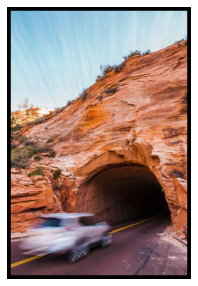

In [16]:
tunnel = cv.imread('img/tunnel.jpg')
b, g, r, = cv.split(tunnel)
b = np.pad(b, (20, 20), mode='constant', constant_values=(0))
g = np.pad(g, (20, 20), mode='constant', constant_values=(0))
r = np.pad(r, (20, 20), mode='constant', constant_values=(0))
bordered_tunnel = cv.merge([b, g, r])
show(bordered_tunnel)

>You can use OpenCV's `flip` function to flip a picture horizontally or vertically:

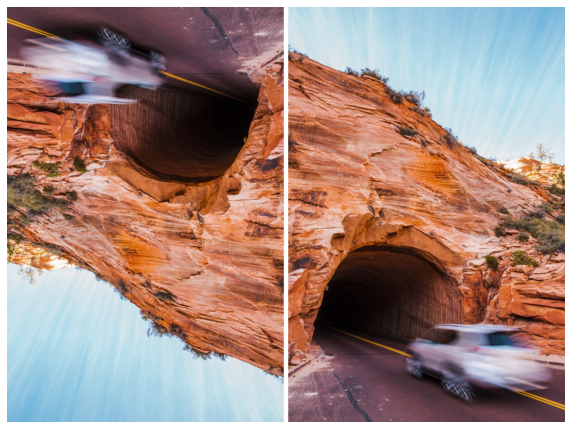

In [17]:
flipped_v_tunnel = cv.flip(tunnel, 0)
flipped_h_tunnel = cv.flip(tunnel, 1)
show_sbs((flipped_v_tunnel, flipped_h_tunnel), show_width = 10)

There are also built-in OpenCV functions for resizing, rotating, and annotating images. We will explore those when they become useful to us.

Lastly, make sure you understand **masks** and **thresholding**, which allow us to perform logical operations on images.

Let's say, for example, we want to display which pixels in our tunnel image have a brightness exceeding some threshold value. We can first create a logical *mask matrix*, where pixel positions with brightness exceeding the threshold hold 1, and those not exceeding the threshold are 0. Then, we can scale the 1 pixels up to pure white by multiplying by 255:

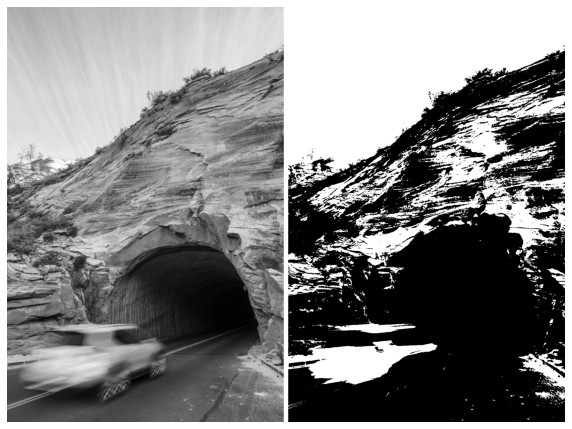

In [18]:
bright_pixels_tunnel = ((gray_tunnel > 150) * 255).astype(np.uint8)
show_sbs((gray_tunnel, bright_pixels_tunnel), show_width = 10)

**Summary**
1. We can perform mathematical operations on images, individual pixels, or ranges of pixels.
2. Many basic arithmetic operations do not play nice with uint8 values.
3. We can add, flip, roll, and pad images.
4. We can also perform logical operations on images.
**Exercises**
1. Write a function, `crop`, that takes as arguments an input filepath to a grayscale or color image, a tuple for the top left position, height, and width to crop the image to. It should save the image as `cropped_image.jpg`, in the same folder as the original image.
2. Write a function, `blend`, that blends two images and takes three arguments: an image, another image, and the weight (from 0-1) of the first image. The function should return the blended image in BGR, even if one or both of the input images was grayscale (this will make it easier to code). Do not use OpenCV's `add_weighted` function. In the future, though, use the OpenCV implementation.
3. Write a function, `invert`, that inverts the colors in an image. See if you can do it in one line with only one function call.
4. Salt and pepper noise randomly adds black or white pixels to an image at a certain frequency. Write a function, `s_p_noise`, that takes as arguments an image and a probability (from 0-1) of adding either salt or pepper (at equal probability) noise at each pixel. *Do not use any loops.*
5. Write a function, `gaussian_noise`, that adds gaussian noise to a grayscale image. There should be three arguments: the image, the mean of the gaussian noise, and the standard deviation of the gaussian noise. Try out different values for $\mu$ and $\sigma$ and see the effect they have on the image.
6. Write a function, `doc_scanner`, that converts an image to black and white, washing out any of the image that does not appear to be typed or written (i.e., that does not appear to be dark). You will have to tweak a threshold parameter to make it work decently well. Use the `img/letter.jpg` image to tune the threshold. The threshold should not be a parameter to the function.

**Exercise 1:** This is hopefully rather straightforward with NumPy slicing. Notice that you don't need to worry about checking whether the image is color or grayscale, since slicing will capture any depth. We should probably be mindful that the cropped area is within the image.

In [19]:
def crop(filepath, position, crop_height, crop_width):
    """
    Crops the image at the given filepath to the rectangle whose upper left coordinate is given by position
    and whose height and width are passed.
    The cropped image is stored as 'cropped_image.jpg' in the same folder as the input image.
    Returns the cropped image.
    """
    image = cv.imread(filepath)
    height, width = image.shape[0], image.shape[1]
    min_y, max_y = position[0], position[0] + crop_height
    min_x, max_x = position[1], position[1] + crop_width
    if min_x < 0 or min_y < 0 or min_x >= width or min_y >= height:
        raise ValueError('Top left pixel must lie within the original image.')
    if max_x > width or max_y > height:
        raise ValueError('Cropped area must lie within the original image.')
    cropped_image = image[min_y : max_y, min_x : max_x]
    cropped_filepath = filepath[ : filepath.rindex("/") + 1] + 'cropped_image.jpg'
    cv.imwrite(cropped_filepath, cropped_image)
    print("Cropped image saved to '{}'".format(cropped_filepath))
    return cropped_image

Cropped image saved to 'img/cropped_image.jpg'


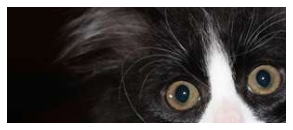

In [20]:
cropped_cat = crop('img/cat.jpg', (0, 0), 125, 300)
show(cropped_cat)

**Exercise 2:** Let's make use of the OpenCV `add` function we saw earlier. To deal with blending color and grayscale images, let's convert grayscale inputs to color.

In [21]:
def blend(image_1, image_2, image_1_weight):
    """
    Adds image_1 to image_2, but weights the images according the image_1_weight.
    For example, if image_1_weight were 0.3, the blended image would be 0.3 * image_1 + 0.7 * image_2.
    Returns the blended image in BGR, regardless of input type.
    """
    if len(image_1.shape) < 3:
        image_1 = cv.cvtColor(image_1, cv.COLOR_GRAY2BGR)
    if len(image_2.shape) < 3:
        image_2 = cv.cvtColor(image_2, cv.COLOR_GRAY2BGR)
    if image_1.size != image_2.size:
        raise ValueError('Images must be the same size.')
    if image_1_weight < 0 or image_1_weight > 1:
        raise ValueError('Image 1 weight must be on [0, 1].')
    image_2_weight = 1 - image_1_weight
    blended_image = cv.add(image_1_weight * image_1, image_2_weight * image_2).astype(np.uint8)
    return blended_image

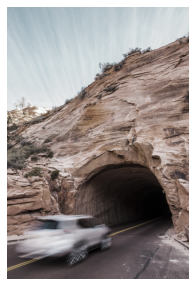

In [22]:
gray_color_tunnel = blend(tunnel, gray_tunnel, 0.3)
show(gray_color_tunnel)

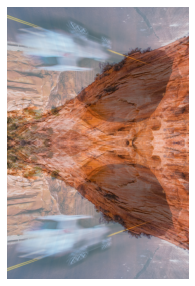

In [23]:
up_and_down_tunnel = blend(tunnel, flipped_v_tunnel, 0.5)
show(up_and_down_tunnel)

**Exercise 3:** For inversion, we can make each pixel 255 minus its current value (`invert`) or we can bitwise invert each pixel value (`invert_bitwise`). The result is the same, as these are mathematically equivalent operations for 8-bit unsigned values. You can also use NumPy's `invert` function or OpenCV's `bitwise_not` function, but the tilde operator (`~`) is the simplest.

In [24]:
def invert(image):
    """
    Returns the inverse of an image.
    """
    inverted_image = 255 - image
    return inverted_image

def invert_bitwise(image):
    """
    Returns the inverse of an image.
    """
    return ~image

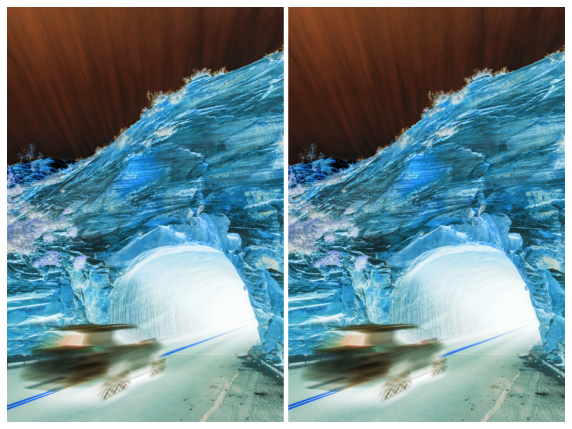

In [25]:
inverted_tunnel = invert(tunnel)
bitwise_inverted_tunnel = invert_bitwise(tunnel)
show_sbs((inverted_tunnel, bitwise_inverted_tunnel), show_width = 10)

**Exercise 4:** Here's a good time to introduce OpenCV's `subtract` function, which does exactly what you would assume it does. In order to avoid loops, take advantage of NumPy's [`rand`](https://numpy.org/doc/1.16/reference/generated/numpy.random.rand.html#numpy.random.rand) function. Underneath the hood, much of what NumPy does with matrices is parallelized and works noticeably faster than iterative solutions to the same problem.

In [26]:
def s_p_noise(image, p):
    """
    Adds salt and pepper noise to an image with probability p.
    For example, if p is 0.5, then 25% of pixels are set to white, and 25% are set to black. 
    The remaning 50% are unaffected.
    Returns the noisy image.
    """
    if p < 0 or p > 1:
        raise ValueError('Noise probability must be between 0 and 1.')
    s_p_mask = np.random.rand(image.shape[0], image.shape[1])
    pepper = s_p_mask < (p / 2)
    salt = (s_p_mask >= (p / 2)) & (s_p_mask < p)
    salt = (salt * 255).astype(np.uint8)
    pepper = (pepper * 255).astype(np.uint8)
    if len(image.shape) == 3:
        salt = cv.cvtColor(salt, cv.COLOR_GRAY2BGR)
        pepper = cv.cvtColor(pepper, cv.COLOR_GRAY2BGR)
    peppered_image = cv.subtract(image, pepper)
    noisy_image = cv.add(peppered_image, salt)
    return noisy_image

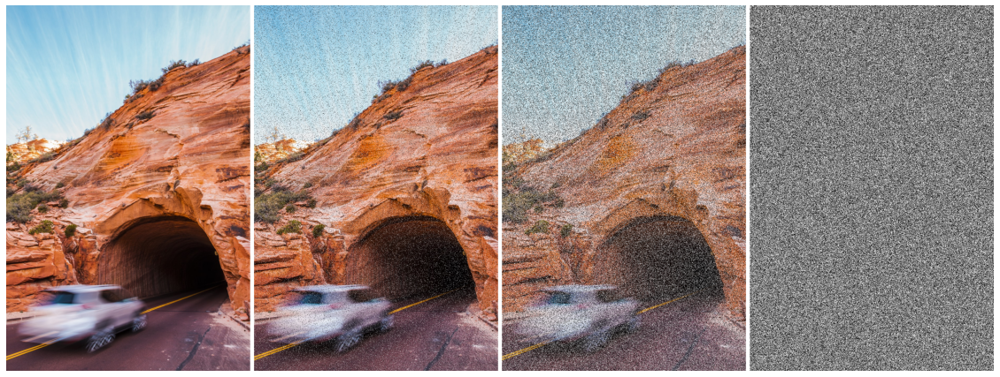

In [27]:
light_s_p_noise = s_p_noise(tunnel, 0.1)
med_s_p_noise = s_p_noise(tunnel, 0.4)
all_s_p_noise = s_p_noise(tunnel, 1.0)
show_sbs((tunnel, light_s_p_noise, med_s_p_noise, all_s_p_noise), show_width = 20)

**Exercise 5:** It would be foolish to not take advantage of NumPy's [`normal`](https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html#numpy.random.normal) function. Hopefully you tried writing this function on your own first, and hopefully you ran into some issues when testing different values of $\mu$ and $\sigma$. Namely, we have to permit negative values of gaussian noise, *and* we have to properly add those negative values to the image. For that reason, I have opted to deal with the data as 16-bit signed integers. That way, we keep track of overflow (beyond 255 or below 0).

You should notice that when $\mu$ is large (closer to 255), the image is brighter; when $\mu$ is large but negative (closer to -255), the image is darker. The larger $\sigma$ becomes, the grainier the noise becomes. Indeed, we make $\sigma$ very large, the gaussian noise just looks like salt and pepper noise.

In [28]:
def gaussian_noise(image, mu=0, sigma=1):
    """
    Adds gaussian noise to an image.
    Mu and sigma are the mean and standard deviation of the noise.
    Returns the noisy image.
    """
    image = image.astype(np.int16)
    noise = np.random.normal(mu, sigma, image.shape).astype(np.int16)
    noisy_image = cv.add(image, noise, dtype=cv.CV_8UC1)
    return noisy_image

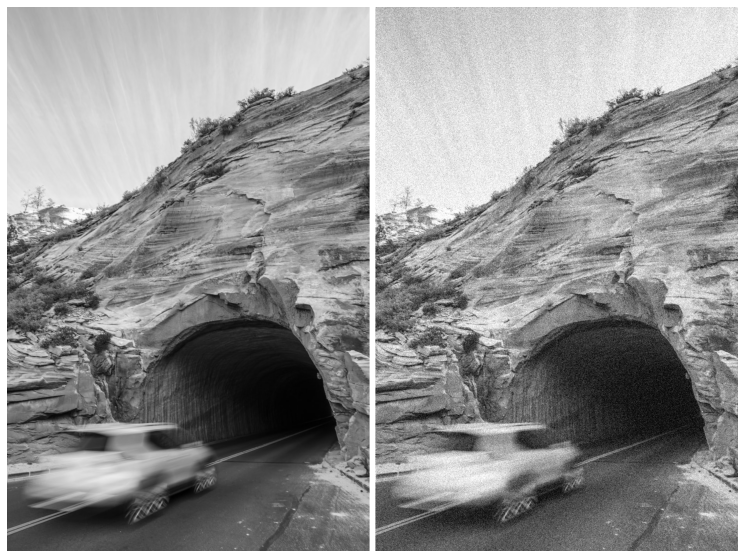

In [29]:
gauss_tunnel = gaussian_noise(gray_tunnel, 15, 25)
show_sbs((gray_tunnel, gauss_tunnel), show_width=15)

**Exercise 6:** This is similar to the threshold example I provided above. In the future, we will explore better ways to approach this type of problem. For now, manually tune the threshold parameter. (If you can think of a mathematical way to dynamically set the threshold based on the input image, then do that instead. If you can't think of such a way, then start thinking of such a way—like using the median pixel intensity.) Notice I've found the values that are *lighter* than the threshold and set them to white by multiplying by 255.

In [30]:
def doc_scanner(image):
    """
    Converts a written note to black and white.
    """
    threshold = 150
    image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    light_pixels = image > threshold
    light_pixels = (light_pixels * 255).astype(np.uint8)
    return light_pixels

def doc_scanner_2(image):
    """
    Converts a written note to black and white.
    """
    image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    threshold = 0.75 * np.median(image)
    light_pixels = image > threshold
    light_pixels = (light_pixels * 255).astype(np.uint8)
    return light_pixels

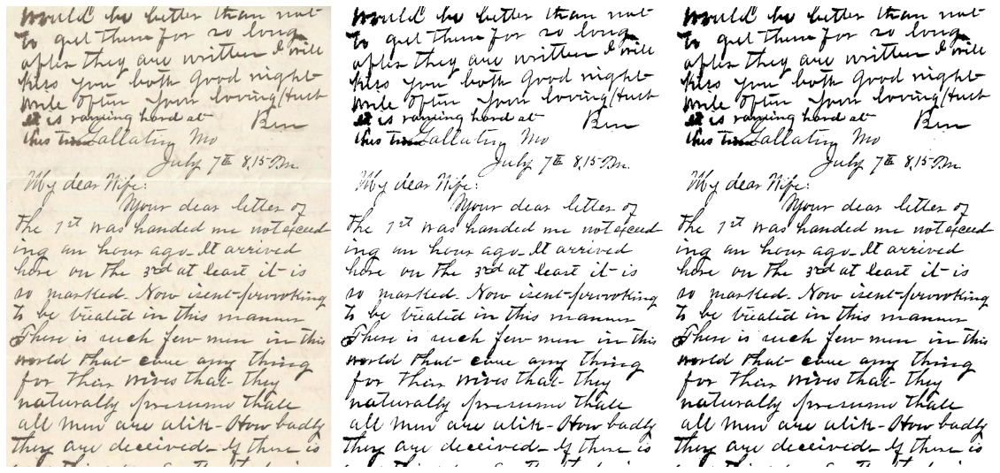

In [31]:
letter = cv.imread('img/letter.jpg')
scanned = doc_scanner(letter)
scanned_2 = doc_scanner_2(letter)
show_sbs((letter, scanned, scanned_2), show_width=20)

Here, I think the first "scanned" letter looks a bit cleaner, but can we be so sure that the threshold value I've chosen (150) will work for every input? Let's see how it works on another example:

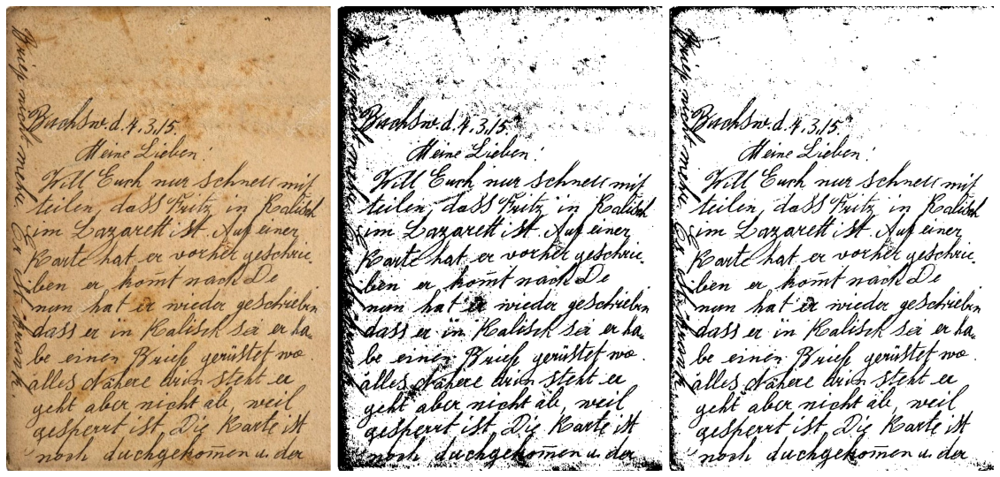

In [32]:
letter2 = cv.imread('img/letter_2.jpg')
scanned2 = doc_scanner(letter2)
scanned2_2 = doc_scanner_2(letter2)
show_sbs((letter2, scanned2, scanned2_2), show_width=20)

The threshold value I chose for the first letter didn't work so well here, but filtering based on a value slightly below the median pixel intensity worked well for both images. We will revisit this dynamic approach to image processing frequently (and, when we examine CNNs, we will discuss this [overfitting](https://towardsdatascience.com/deep-learning-3-more-on-cnns-handling-overfitting-2bd5d99abe5d) problem again).

### 2.3 Image Filters
In the previous section, we introduced noise, which is important to consider in image processing. Remember, an image is data that has been collected and trasmitted. If you have some experience with some data science fundamentals, you know that you will never have perfect data, and often times it's necessary to impute missing values and deal with outliers; images are no different. Indeed, noise crops up in a variety of forms for a variety of reasons, many of which we will discuss in the future.

For now, let's think about how we can remove noise from an image.

Consider the following values, which we'll say represent a patient's oxygen saturation (%) measured every second:

$$98, 97, 98, 98, 99, 97, 32, 98, 99, 99, 100, 97, 98, 98, 98, 98, 97, 96, 99, 98$$

That 32 should look rather weird *in this context*. Of course, if we were measuring a patient's oxygen saturation every *minute*, then an oxygen saturation of 32% would mean something has gone terribly wrong (an O2-sat below 80% is quickly lethal). But, since we are measuring every second and see that all the surrounding values are nowhere near 32%, it's much more likely there was an error when the machine read that value; perhaps, for example, the patient momentarily removed the oximeter from his finger. Notice that the value 32 is distorted from its "true" value due to some source of **noise**.

What value *should* we see there instead? (Read as: *how do we de-noise our data?*) Our intuition suggests that it's likely the 32 should be very close to the values immediately surrounding it. Indeed, there is some variation throughout the data, and it's likely that the "signal" in our data is a relatively constant 98% with some noise throughout.

We can de-noise, or *smooth*, our data by applying a rolling average, where each value is set to be the average of the values surrounding it"


- Average
- Min/Max/Median
- Gaussians

In [33]:
def rolling_average(data, width):
    """
    Returns the uniform-weighted rolling average values for a list with the given window width.
    Width must be an odd integer.
    Values at the end of the list (such that the window would extend beyond the list) are not changed.
    For example, rolling_average([1, 3, 3, 2, 1, 4, 4, 2], 3) returns [1, 2.33, 2.67, 2, 2.33, 3, 3.33, 2]
    """
    if type(width) != int:
        raise TypeError('Width must be an integer.')
    if width % 2 != 1:
        raise ValueError('Width must be an odd integer.')
    if width > len(data):
        raise ValueError('Width cannot exceed the length of the input list.')
    result = []
    size = len(data)
    offset = width // 2 #how far to the left or right of each value does the window extend?
    for i in range(size):
        if (i - offset) < 0 or (i + offset) >= size:
            result.append(data[i])
        else:
            avg = np.mean(data[i-offset : i + offset + 1])
            result.append(avg)
    return result

In [34]:
print([round(x, 2) for x in rolling_average([1, 3, 3, 2, 1, 4, 4, 2], 3)])

[1, 2.33, 2.67, 2.0, 2.33, 3.0, 3.33, 2]


Let's apply this rolling average to our oxygen saturation data:

In [35]:
oxygen_data = [98, 97, 98, 98, 99, 97, 32, 98, 99, 99, 100, 97, 98, 98, 98, 98, 97, 96, 99, 98]
print([round(x, 2) for x in rolling_average(oxygen_data, 3)])

[98, 97.67, 97.67, 98.33, 98.0, 76.0, 75.67, 76.33, 98.67, 99.33, 98.67, 98.33, 97.67, 98.0, 98.0, 97.67, 97.0, 97.33, 97.67, 98]


We just applied an average *filter* to our data. Notice two things: first, the values we get by applying the filter depend on how wide we make the filter window (I set it to 3 but that was a moderately arbitrary choice); and second, we solved one problem but created another, since now we have *three* values that seem much lower than they ought to be. Indeed, this problem is compounded with an even wider filter window:

In [36]:
window_size = 7
print([round(x, 2) for x in rolling_average(oxygen_data, window_size)])

[98, 97, 98, 88.43, 88.43, 88.71, 88.86, 89.14, 88.86, 89.0, 98.43, 98.43, 98.29, 98.0, 97.43, 97.71, 97.71, 96, 99, 98]


Recall from statistics that the mean of a dataset is not **resistant** to outlier values. Perhaps a better approach here is to use the *median* as our filter instead of the mean, since the median is resistant to outliers:

In [37]:
def rolling_average_2(data, width, method='mean'):
    """
    Returns the rolling average values for a list with the given window width.
    If method is 'mean', computes a uniform-weighted arithmetic mean.
    If method is median, computes the median.
    Width must be an odd integer.
    Values at the end of the list (such that the window would extend beyond the list) are not changed.
    For example, rolling_average([1, 3, 3, 2, 1, 4, 4, 2], 3) returns [1, 2.33, 2.67, 2, 2.33, 3, 3.33, 2]
    """
    if type(width) != int:
        raise TypeError('Width must be an integer.')
    if width % 2 != 1:
        raise ValueError('Width must be an odd integer.')
    if width > len(data):
        raise ValueError('Width cannot exceed the length of the input list.')
    result = []
    size = len(data)
    offset = width // 2 #how far to the left or right of each value does the window extend?
    for i in range(size):
        if (i - offset) < 0 or (i + offset) >= size:
            result.append(data[i])
        elif method == 'mean':
            avg = np.mean(data[i-offset : i + offset + 1])
            result.append(avg)
        elif method == 'median':
            med = np.median(data[i-offset : i + offset + 1])
            result.append(med)
        else:
            raise ValueError('Method must be mean or median.')
    return result

In [38]:
window_size = 7
print([round(x, 2) for x in rolling_average_2(oxygen_data, window_size, 'median')])

[98, 97, 98, 98.0, 98.0, 98.0, 98.0, 99.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 96, 99, 98]


This seems more reasonable. But will it always be more reasonable to use median filtering instead of mean filtering? Not necessarily. It depends on context. Here, we knew the data ahead of time: we knew by inspection that 32 was an outlier, and we knew that it was safe to ignore that value because the granularity of the data was high enough (measured every second). We will not always know that ahead of time, and there is surely much more variation in image data than there is in oxygen-saturation data.

Without getting too into the weeds here, remember that **context always matters**. If we wanted to be ultra-sensitive to low oxygen saturation values, we could have instead used a minimum filter, such that the 32 would have replaced all surrounding values by 32.

Before we move forward, let's discuss code. Most of the functions I have written thus far *can* be coded in far fewer lines, without descriptions, and without sanity checks. For your own sake, don't do this. Document what functions do, and think ahead about potential arguments that might cause issues. If you want to write code that you and others can use/reuse, then be clean about it. Write code that is easy to understand. Your goal should never be to write code that is compact if such concision comes at the expense of clarity and readibility.

Now, your goal absolutely should be to write code that runs fast. Keep this in mind as we try to apply our filter to images. Our quest wasn't to find a way to remove noise fromm lists of integers but to remove noise from images (which are 2-dimensional).

As with the oxygen saturation data, to apply a filter to an image, we'll take some function (here, median) of a pixel and its surrounding pixels, and then set the value of the pixel equal to the output of the function. Since we are in two dimensions, the "surrounding" pixels are those that form the square around a pixel.

Here's our code adapted for images:

In [39]:
def rolling_average_image(image, frame_width, method):
    """
    Applies a uniform-weighted arithmetic mean rolling average filter to a grayscale image.
    Width must be an odd integer.
    Values at the ends of the image (such that the filter frame would extend beyond an edge) are not changed.
    """
    height, width = image.shape
    averaged_image = np.zeros(image.shape, dtype=np.uint8)
    if type(frame_width) != int:
        raise TypeError('Width must be an integer.')
    if frame_width % 2 != 1:
        raise ValueError('Width must be an odd integer.')
    if frame_width > height or frame_width > width:
        raise ValueError('Filter frame cannot exceed the size of the image.')
    offset = frame_width // 2 #how far to the left or right of each value does the window extend?
    for x in range(width):
        for y in range(height):
            if (x - offset) < 0 or (x + offset) > width or (y - offset) < 0 or (y + offset) > height:
                averaged_image[y, x] = image[y, x]
            elif method == 'mean':
                averaged_image[y, x] = np.mean(image[y - offset : y + offset + 1, x - offset : x + offset + 1])
            elif method == 'median':
                averaged_image[y, x] = np.median(image[y - offset : y + offset + 1, x - offset : x + offset + 1])
            else:
                raise ValueError('Method must be mean or median.')
    return averaged_image

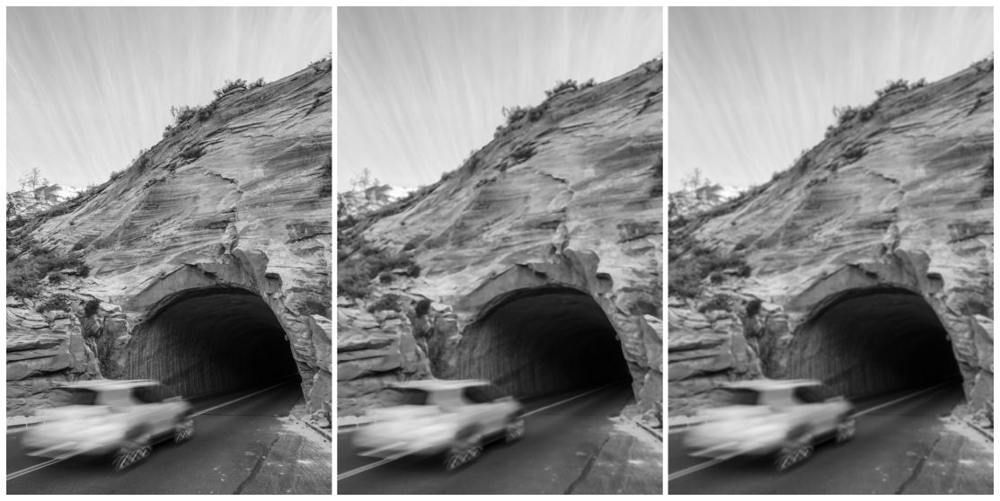

In [40]:
# This should take around a minute to run.
median_filtered_tunnel = rolling_average_image(gray_tunnel, 7, 'median')
mean_filtered_tunnel = rolling_average_image(gray_tunnel, 7, 'mean')
show_sbs((gray_tunnel, median_filtered_tunnel, mean_filtered_tunnel), show_width=20)

What you should notice is a slight blurring effect. The extent of the blur will depend on the width of the filter frame, the size of the image, and the content of the image. Now, our goal was to find a way to *remove noise*. Let's see if our average filters can remove the noise from the `gauss_tunnel` image we generated above:

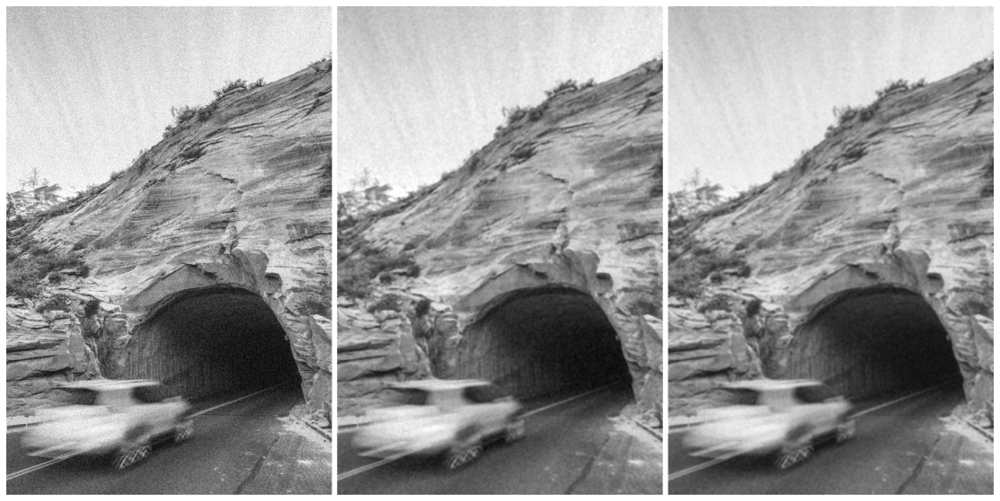

In [41]:
# This should take about a minute to run.
denoised_median = rolling_average_image(gauss_tunnel, 7, 'median')
denoised_mean = rolling_average_image(gauss_tunnel, 7, 'mean')

show_sbs((gauss_tunnel, denoised_median, denoised_mean), show_width=20)

You can hopefully see that much of the noise in the original image has been smoothed away by our filter. Of course, we don't get our original image back, but we do mitigate some of the noise. No matter what method we use, and always depending on the image we are using, there is a balance between removing noise and compromising the data in our image. Once you've blurred, you can't go back! If I tell you, for example, that the average of 7 numbers is 50, can you tell me what the 7 numbers were? The same dilemma applies to filtering.

This about brings us to the end of our introduction to filtering, but we've just generated a few problems that springboard us into the topic of our next notebook. In particular, this algorithm for filtering is *extremely* slow. Imagine if you applied a blur in Photoshop and it took 20 seconds to appear on-screen (some of us do remember a time when that wasn't far off from reality).
>We need to speed up our filtering.

Also, we ignored pixels that were on the edges. Is that safe to do? Particularly when we look at Fourier transforms, we'll see that that is *not* safe to do.
>We need to be careful of how we treat edges.

Lastly, we implicitly assumed that all pixels are created equal: every pixel around a given pixel was given equal weight in the averaging. Is that a reasonable assumption? Perhaps. But it might also be the case that pixels closer to the central pixel should be given more weight (and that the central pixel itself should be given the most weight). Indeed, such a filter would intuitively be better at smoothing away noise while less prone to blurring and losing valuable data in the image.
>We need better filter patterns.

The fix for these problems is **correlation filtering**, which we'll dive into next.

**Summary**
1. Most images will contain some amount of noise that we will often want to try and remove.
2. We assume that surrounding pixels give us some information about a central pixel.
3. We can use a filter to set values equal to some function of each pixel and its surrounding pixels.
4. The type of filter we use depends on the type of noise and other contextual information.

**Exercises**
1. Without using any Python modules for measuring time, compare the relative performance between our median average filter and OpenCV's `medianBlur` function. Use a ksize of 7 and the default borderType argument. Which is faster? Is the difference in speed substantial?
2. Do the same for OpenCV's `blur` function and compare to our mean average filter. Use a ksize of (7, 7) and the default borderType argument.
3. Use OpenCV's `medianBlur` and `blur` functions to try to de-noise the `light_s_p_noise` and `med_s_p_noise` images we generated above. Which works better?

**Exercise 1:** You should find that OpenCV's `medianBlur` function is nearly instantaneous, compared to our function, which took 20 seconds or so to run on the noisy tunnel image.

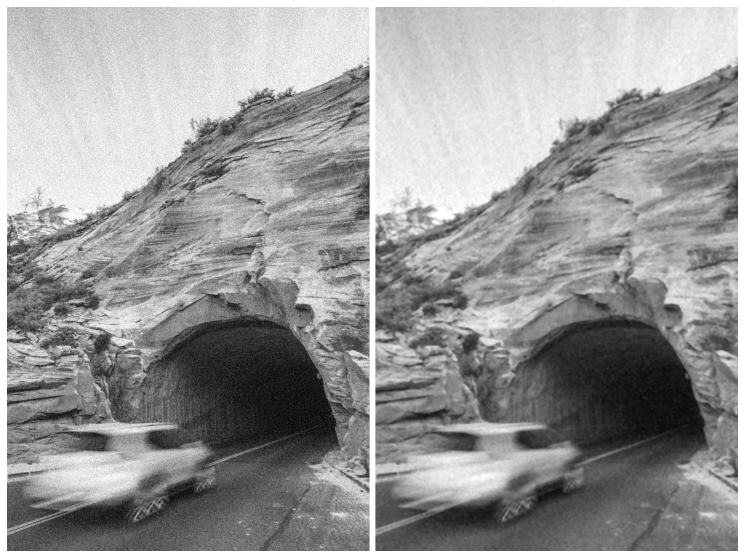

In [42]:
cv_median_denoised_tunnel = cv.medianBlur(gauss_tunnel, ksize=7)
show_sbs((gauss_tunnel, cv_median_denoised_tunnel), show_width=15)

**Exercise 2:** You should similarly find that OpenCV's `blur` function is nearly instantaneous, compared to our function, which took 20 seconds or so to run on the noisy tunnel image.

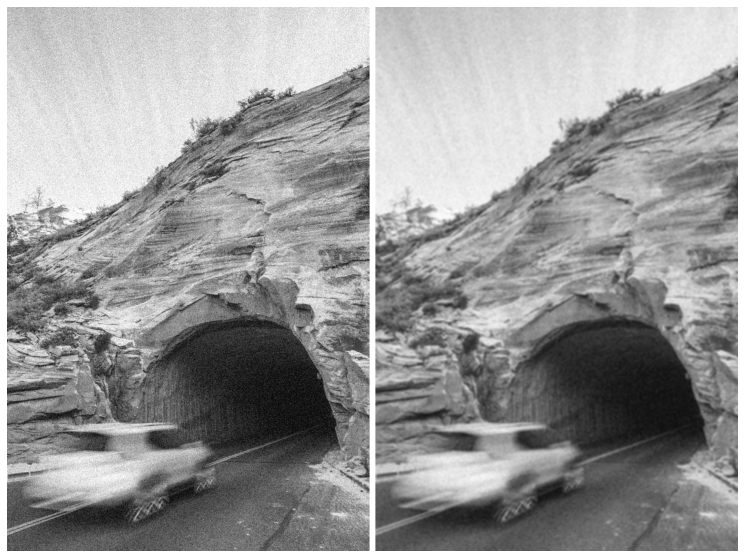

In [43]:
cv_mean_denoised_tunnel = cv.blur(gauss_tunnel, ksize=(7, 7))
show_sbs((gauss_tunnel, cv_mean_denoised_tunnel), show_width=15)

We can check that these smoothed images are identical to those we produced iteratively (except for the edges, which we did not consider). The mean averaged images are not *exactly* the same, as the pixel values occasionally differ by 1, which I suspect is due to the different data types used in intermediate calculations, but the difference may as well be zero, as you can see below:

Median difference: 0

Mean difference:


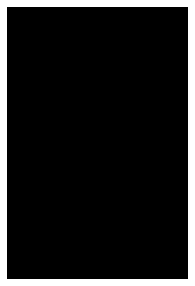

In [44]:
height, width, _ = tunnel.shape
no_edges_our_median = (denoised_median[4 : height - 4, 4 : width - 4])
no_edges_cv_median = (cv_median_denoised_tunnel[4 : height - 4, 4 : width - 4])
diff_median = np.sum(no_edges_our_median != no_edges_cv_median)
print('Median difference: {}'.format(diff_median))
no_edges_our_mean = (denoised_mean[4 : height - 4, 4 : width - 4]).astype(np.int16)
no_edges_cv_mean = (cv_mean_denoised_tunnel[4 : height - 4, 4 : width - 4]).astype(np.int16)
diff_mean = np.abs(no_edges_our_mean - no_edges_cv_mean).astype(np.uint8)
print('\nMean difference:')
show(diff_mean)

**Exercise 3:** We find that the median filter is highly effective at removing salt and pepper noise, while the mean filter is not—especially when we use a small filter frame. Remember, the mean filter is not resistant to outliers, and salt and pepper noise introduces extreme outliers into an image. Once again, notice how fast this runs.

The original noisy images are followed by the median-filtered images, followed by the mean-filtered images.

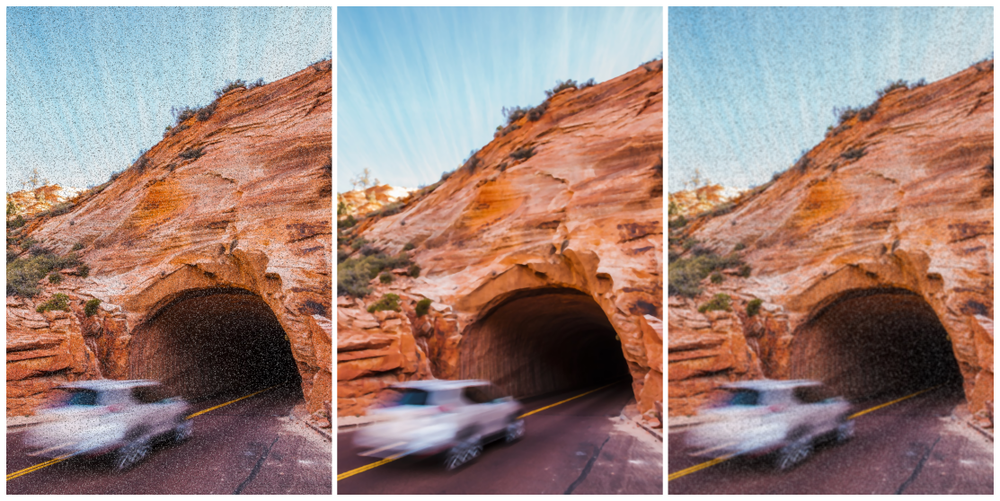

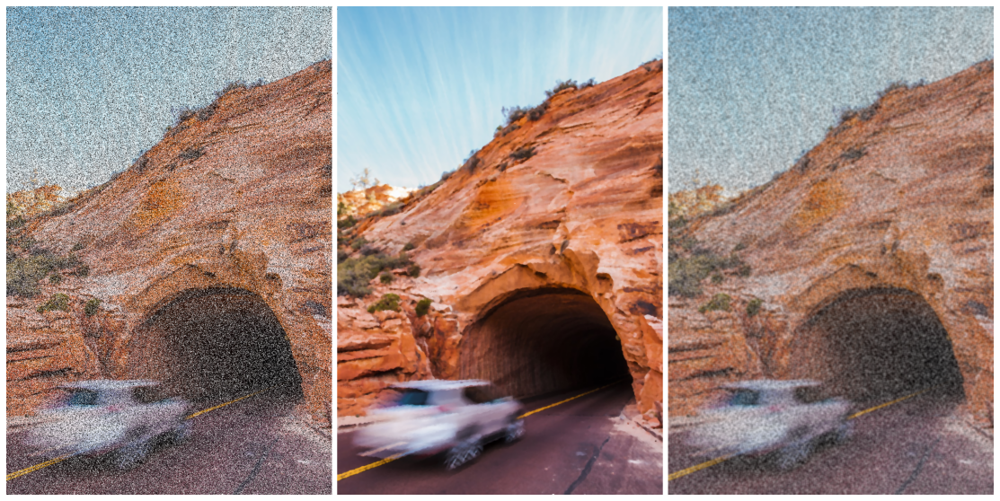

In [45]:
median_denoise_light = cv.medianBlur(light_s_p_noise, ksize=7)
mean_denoise_light = cv.blur(light_s_p_noise, ksize=(7, 7))
show_sbs((light_s_p_noise, median_denoise_light, mean_denoise_light), show_width=20)
median_denoise_med = cv.medianBlur(med_s_p_noise, ksize=7)
mean_denoise_med = cv.blur(med_s_p_noise, ksize=(7, 7))
show_sbs((med_s_p_noise, median_denoise_med, mean_denoise_med), show_width=20)

## Conclusion
You should come away from this notebook with a stronger understanding of how we can manipulate images, both manually and using built-in functions from NumPy and OpenCV. Many of the processes we'll be applying to images in the future rely heavily on matrix operations, which are highly optimized and often run several orders of magnitude faster than iterative approaches. If you find yourself ever iterating over an image, it is likely there are better ways to solve your problem. You'll leave the next notebook feeling much more comfortable working with such approaches.